# Market Basket

### Para indentificar reglas de asociacón ocultas entre diversos elementos pertenecientes a grande bases de datos.

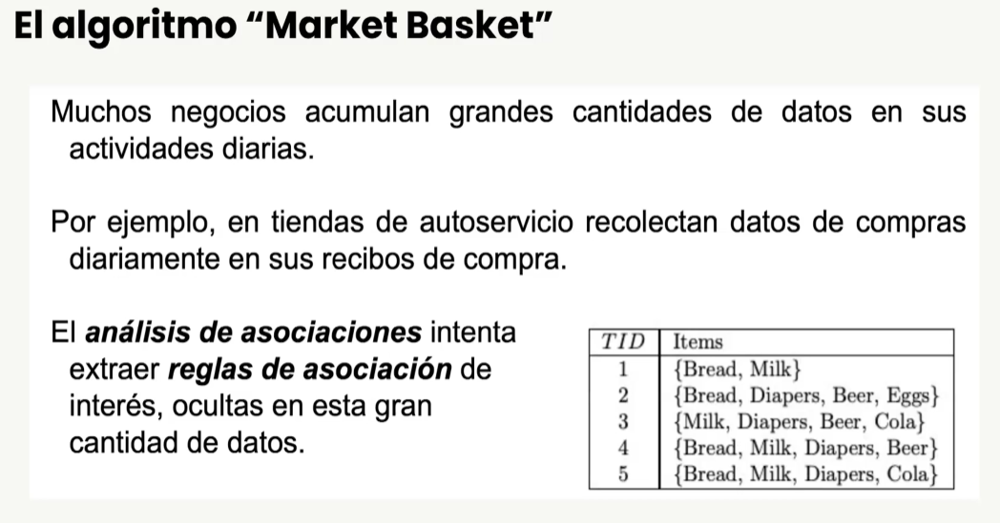

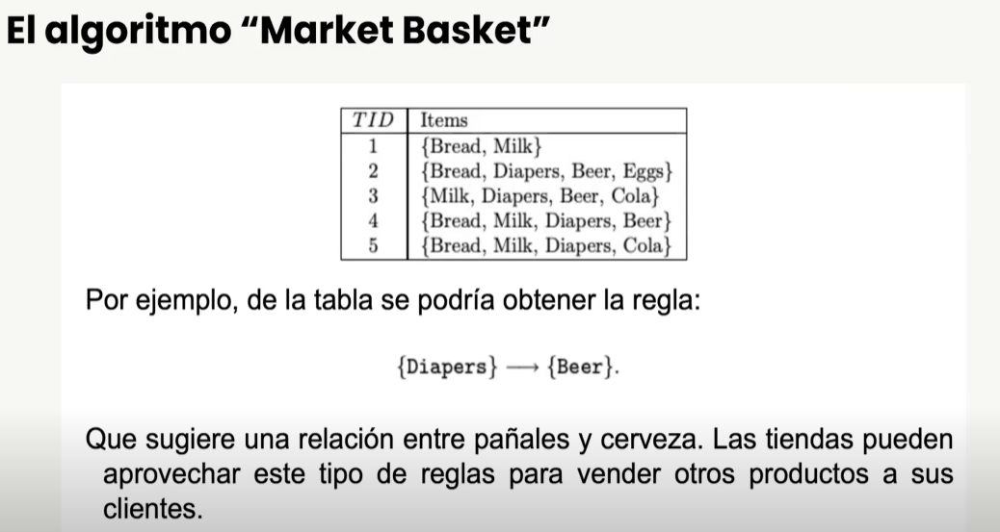

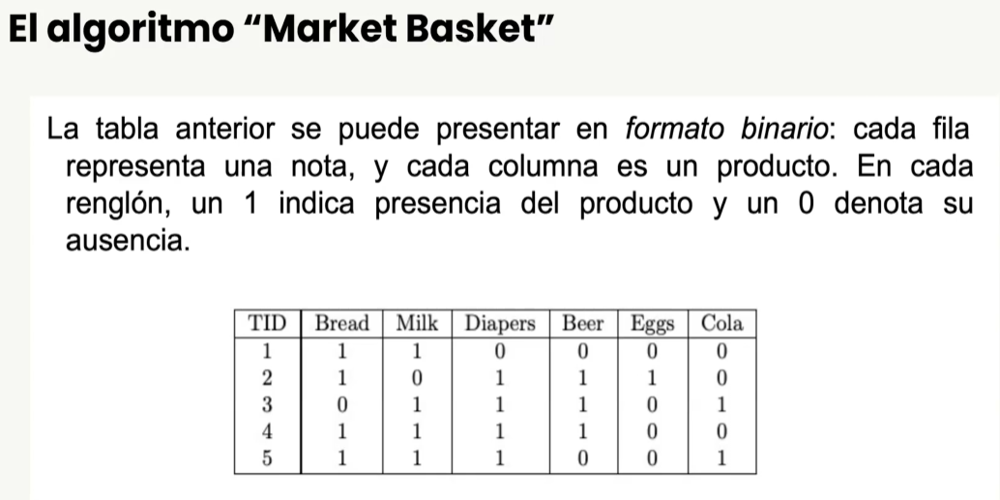

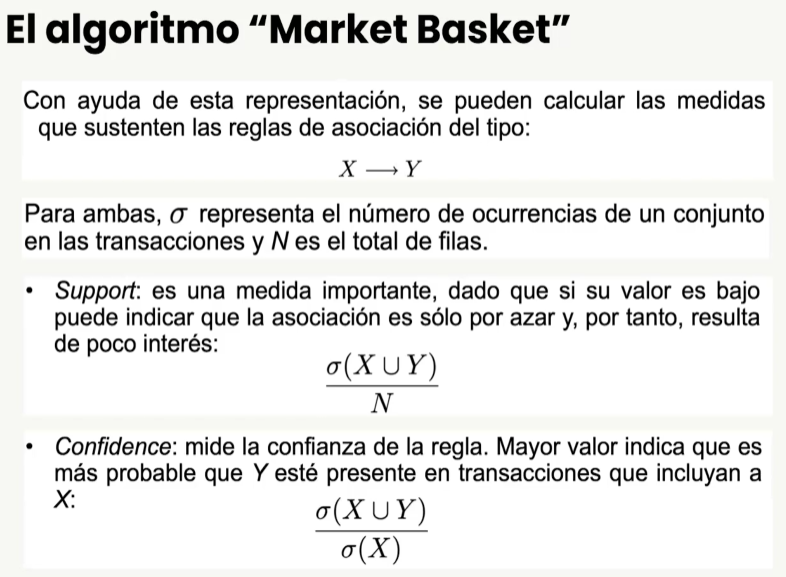

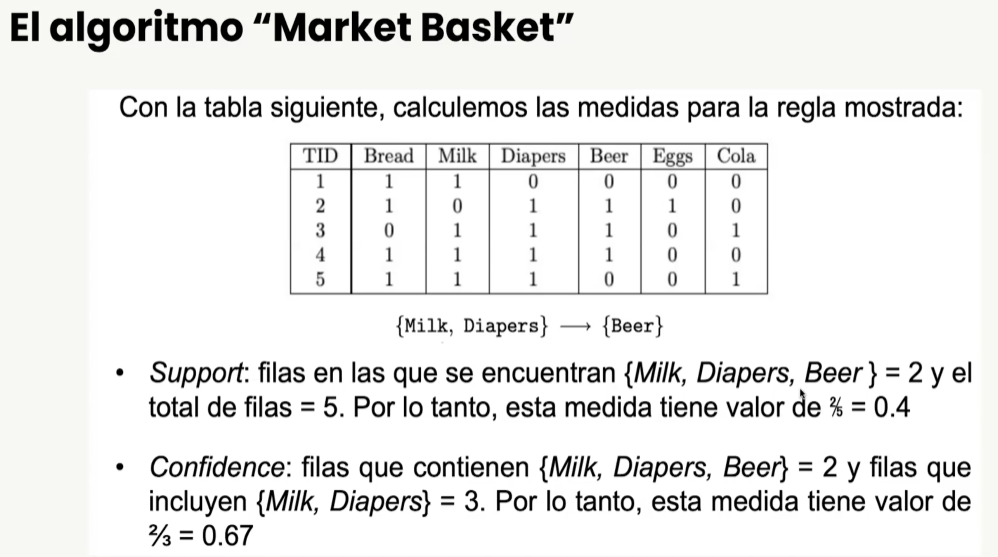

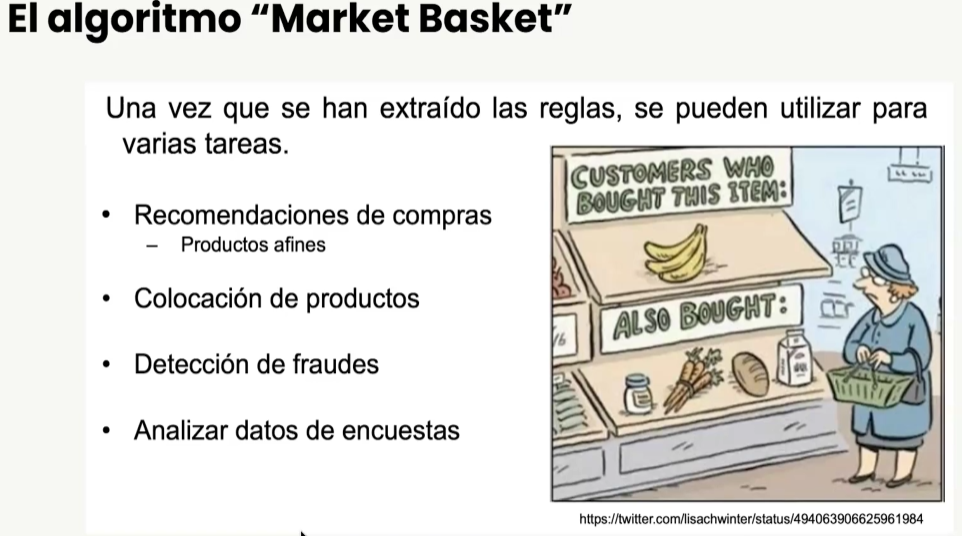

In [1]:
! pip install openpyxl

In [3]:
import os
import pandas as pd

os.chdir(r"C:\Users\randy\OneDrive\Documents\Python Scripts")
datos = pd.read_excel("Online Retail.xlsx")
datos.head(10)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
5,536365,22752,SET 7 BABUSHKA NESTING BOXES,2,2010-12-01 08:26:00,7.65,17850.0,United Kingdom
6,536365,21730,GLASS STAR FROSTED T-LIGHT HOLDER,6,2010-12-01 08:26:00,4.25,17850.0,United Kingdom
7,536366,22633,HAND WARMER UNION JACK,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom
8,536366,22632,HAND WARMER RED POLKA DOT,6,2010-12-01 08:28:00,1.85,17850.0,United Kingdom
9,536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,2010-12-01 08:34:00,1.69,13047.0,United Kingdom


In [4]:
# Eliminar todos los valores Vacios o NULL
datos = datos.dropna()
datos.info()

<class 'pandas.core.frame.DataFrame'>
Index: 406829 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    406829 non-null  object        
 1   StockCode    406829 non-null  object        
 2   Description  406829 non-null  object        
 3   Quantity     406829 non-null  int64         
 4   InvoiceDate  406829 non-null  datetime64[ns]
 5   UnitPrice    406829 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      406829 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 27.9+ MB


In [6]:
# Delimitacion de valores postivos del campo QUANTITY (Pues solo deseamos analizar lo realmente comprado)
datos_reales = datos[datos['Quantity'] > 0]
datos_reales.info() 

<class 'pandas.core.frame.DataFrame'>
Index: 397924 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    397924 non-null  object        
 1   StockCode    397924 non-null  object        
 2   Description  397924 non-null  object        
 3   Quantity     397924 non-null  int64         
 4   InvoiceDate  397924 non-null  datetime64[ns]
 5   UnitPrice    397924 non-null  float64       
 6   CustomerID   397924 non-null  float64       
 7   Country      397924 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 27.3+ MB


In [ ]:
# Agrupar datos por InvoiceNo y Description, sumando las cantidades
# Crear una tabla dinámica con InvoiceNo como índice y Description como columnas
# Llenar valores NaN con 0
# Establecer 'InvoiceNo' como índice del DataFrame resultante
# Crear la matriz de productos comprados por transacción

### Practicamente se ordeno la base para el analisis de Market Basket Analysis, conforme a las ventas por prodcuto y las orgenos por factura
### es decir cada renglon representa una facura y cada columna un producto, con una cantidad comprada en cada celda
### esto facilita el analisis de productos que se compran juntos.


basket = (datos_reales.groupby(['InvoiceNo', 'Description']))['Quantity'].sum().unstack().reset_index().fillna(0).set_index('InvoiceNo')
basket

Description,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,I LOVE LONDON MINI RUCKSACK,NINE DRAWER OFFICE TIDY,OVAL WALL MIRROR DIAMANTE,RED SPOT GIFT BAG LARGE,SET 2 TEA TOWELS I LOVE LONDON,SPACEBOY BABY GIFT SET,...,ZINC STAR T-LIGHT HOLDER,ZINC SWEETHEART SOAP DISH,ZINC SWEETHEART WIRE LETTER RACK,ZINC T-LIGHT HOLDER STAR LARGE,ZINC T-LIGHT HOLDER STARS LARGE,ZINC T-LIGHT HOLDER STARS SMALL,ZINC TOP 2 DOOR WOODEN SHELF,ZINC WILLIE WINKIE CANDLE STICK,ZINC WIRE KITCHEN ORGANISER,ZINC WIRE SWEETHEART LETTER TRAY
InvoiceNo,,,,,,,,,,,,,,,,,,,,,
536365,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
536366,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
536367,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
536368,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
536369,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
581583,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
581584,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
581585,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,12.0,0.0,0.0,0.0,24.0,0.0,0.0


In [12]:
# Codificacion a BINARIO de la Base Previa para verificar si un producto se compro o no
# Es decir lo que aremos es comvertir cada valor de cada columna en 1 si se compro 1 o mas articulos, esto para unicamente consentrar el analisis
# Habito de compra y no en la cantidad comprada
# En caso de que no se haya comprado el producto del valor del campo sera 0

def codificar(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1

# Para aplicar nuestra funcion crearemos un nuevo DataFrame llamdado Basket_codificado
# APPLYMAP (Sirve para aplicar una funcion a cada elemento de un DataFrame)

basket_codificado = basket.applymap(codificar)
basket_codificado

C:\Users\randy\AppData\Local\Temp\ipykernel_14608\32301593.py:15: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  basket_codificado = basket.applymap(codificar)


Description,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,I LOVE LONDON MINI RUCKSACK,NINE DRAWER OFFICE TIDY,OVAL WALL MIRROR DIAMANTE,RED SPOT GIFT BAG LARGE,SET 2 TEA TOWELS I LOVE LONDON,SPACEBOY BABY GIFT SET,...,ZINC STAR T-LIGHT HOLDER,ZINC SWEETHEART SOAP DISH,ZINC SWEETHEART WIRE LETTER RACK,ZINC T-LIGHT HOLDER STAR LARGE,ZINC T-LIGHT HOLDER STARS LARGE,ZINC T-LIGHT HOLDER STARS SMALL,ZINC TOP 2 DOOR WOODEN SHELF,ZINC WILLIE WINKIE CANDLE STICK,ZINC WIRE KITCHEN ORGANISER,ZINC WIRE SWEETHEART LETTER TRAY
InvoiceNo,,,,,,,,,,,,,,,,,,,,,
536365,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
536366,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
536367,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
536368,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
536369,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
581583,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581584,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581585,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0


In [13]:
# Filtrado de aquellas transacciones en donde se ha comprado mas de un articulo
basket_filtrado = basket_codificado[(basket_codificado > 0).sum(axis=1) >= 2]
basket_filtrado

Description,4 PURPLE FLOCK DINNER CANDLES,50'S CHRISTMAS GIFT BAG LARGE,DOLLY GIRL BEAKER,I LOVE LONDON MINI BACKPACK,I LOVE LONDON MINI RUCKSACK,NINE DRAWER OFFICE TIDY,OVAL WALL MIRROR DIAMANTE,RED SPOT GIFT BAG LARGE,SET 2 TEA TOWELS I LOVE LONDON,SPACEBOY BABY GIFT SET,...,ZINC STAR T-LIGHT HOLDER,ZINC SWEETHEART SOAP DISH,ZINC SWEETHEART WIRE LETTER RACK,ZINC T-LIGHT HOLDER STAR LARGE,ZINC T-LIGHT HOLDER STARS LARGE,ZINC T-LIGHT HOLDER STARS SMALL,ZINC TOP 2 DOOR WOODEN SHELF,ZINC WILLIE WINKIE CANDLE STICK,ZINC WIRE KITCHEN ORGANISER,ZINC WIRE SWEETHEART LETTER TRAY
InvoiceNo,,,,,,,,,,,,,,,,,,,,,
536365,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
536366,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
536367,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
536368,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
536370,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
581583,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581584,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
581585,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0


In [14]:
# Instalacion de la libreria mLxtend para el analisis de market basket
! pip install mlxtend

   ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
   - -------------------------------------- 0.1/1.4 MB 812.7 kB/s eta 0:00:02
   ----- ---------------------------------- 0.2/1.4 MB 1.7 MB/s eta 0:00:01
   ---------- ----------------------------- 0.4/1.4 MB 2.3 MB/s eta 0:00:01
   ----------------- ---------------------- 0.6/1.4 MB 2.9 MB/s eta 0:00:01
   ---------------------------------------- 1.4/1.4 MB 5.4 MB/s eta 0:00:00
   ---------------------------------------- 0.0/8.7 MB ? eta -:--:--
   ---- ----------------------------------- 0.9/8.7 MB 19.8 MB/s eta 0:00:01
   -------- ------------------------------- 1.8/8.7 MB 19.0 MB/s eta 0:00:01
   ------------ --------------------------- 2.7/8.7 MB 18.8 MB/s eta 0:00:01
   --------------- ------------------------ 3.5/8.7 MB 18.4 MB/s eta 0:00:01
   -------------------- ------------------- 4.4/8.7 MB 18.9 MB/s eta 0:00:01
   -----------------------

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
orange3 3.36.2 requires scikit-learn!=1.2.*,<1.4,>=1.1.0, but you have scikit-learn 1.7.2 which is incompatible.


In [16]:
# Aplicacion del algoritmo Apriori para encontrar conjuntos de articulos que se compran juntos
# Para localizar los articulos frecuentemente comprados en la base de datros

from mlxtend.frequent_patterns import apriori

In [18]:
 # Analsis 'Apriori' con un soporte minimo del 3%
articulos_frecuentes = apriori(basket_filtrado, min_support=0.03, use_colnames=True).sort_values('support', ascending=False).reset_index(drop=True)
articulos_frecuentes['length'] = articulos_frecuentes['itemsets'].apply(lambda x: len(x))
articulos_frecuentes

c:\Users\randy\anaconda3\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:161: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,support,itemsets,length
0,0.113952,(WHITE HANGING HEART T-LIGHT HOLDER),1
1,0.098249,(REGENCY CAKESTAND 3 TIER),1
2,0.092586,(JUMBO BAG RED RETROSPOT),1
3,0.080152,(ASSORTED COLOUR BIRD ORNAMENT),1
4,0.079685,(PARTY BUNTING),1
...,...,...,...
107,0.030356,(SET OF 3 HEART COOKIE CUTTERS),1
108,0.030239,(RED TOADSTOOL LED NIGHT LIGHT),1
109,0.030181,"(LUNCH BAG BLACK SKULL., LUNCH BAG RED RETROS...",2
110,0.030181,(BLUE HARMONICA IN BOX ),1


In [20]:
# Reglas propias del algoritmo
from mlxtend.frequent_patterns import association_rules

In [ ]:
# Esta asociacion esta basada en la metrica de confianza (confidence)
# en el cual los valores mostrados en confidence representa la probabilidad de que un articulo A se compre junto con un artuculo B

association_rules(articulos_frecuentes, metric='confidence', min_threshold=0.5).sort_values('confidence', ascending=False).reset_index(drop=True)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(GREEN REGENCY TEACUP AND SAUCER),(ROSES REGENCY TEACUP AND SAUCER ),0.040339,0.045534,0.031582,0.782923,17.194200,1.0,0.029745,4.396906,0.981430,0.581720,0.772567,0.738257
1,(ROSES REGENCY TEACUP AND SAUCER ),(GREEN REGENCY TEACUP AND SAUCER),0.045534,0.040339,0.031582,0.693590,17.194200,1.0,0.029745,3.131949,0.986773,0.581720,0.680710,0.738257
2,(ALARM CLOCK BAKELIKE GREEN),(ALARM CLOCK BAKELIKE RED ),0.045768,0.051197,0.030940,0.676020,13.204367,1.0,0.028597,2.928590,0.968598,0.468612,0.658539,0.640177
3,(JUMBO BAG PINK POLKADOT),(JUMBO BAG RED RETROSPOT),0.050730,0.092586,0.031874,0.628308,6.786206,1.0,0.027177,2.441309,0.898208,0.286014,0.590384,0.486285
4,(ALARM CLOCK BAKELIKE RED ),(ALARM CLOCK BAKELIKE GREEN),0.051197,0.045768,0.030940,0.604333,13.204367,1.0,0.028597,2.411705,0.974140,0.468612,0.585356,0.640177
5,(LUNCH BAG PINK POLKADOT),(LUNCH BAG RED RETROSPOT),0.054291,0.075131,0.030531,0.562366,7.485099,1.0,0.026452,2.113336,0.916139,0.308737,0.526815,0.484368


In [ ]:
# Esta asociacion esta basada en la metrica de Lift

association_rules(articulos_frecuentes, metric='lift', min_threshold=1.01).sort_values('lift', ascending=False).reset_index(drop=True)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(ROSES REGENCY TEACUP AND SAUCER ),(GREEN REGENCY TEACUP AND SAUCER),0.045534,0.040339,0.031582,0.693590,17.194200,1.0,0.029745,3.131949,0.986773,0.581720,0.680710,0.738257
1,(GREEN REGENCY TEACUP AND SAUCER),(ROSES REGENCY TEACUP AND SAUCER ),0.040339,0.045534,0.031582,0.782923,17.194200,1.0,0.029745,4.396906,0.981430,0.581720,0.772567,0.738257
2,(ALARM CLOCK BAKELIKE RED ),(ALARM CLOCK BAKELIKE GREEN),0.051197,0.045768,0.030940,0.604333,13.204367,1.0,0.028597,2.411705,0.974140,0.468612,0.585356,0.640177
3,(ALARM CLOCK BAKELIKE GREEN),(ALARM CLOCK BAKELIKE RED ),0.045768,0.051197,0.030940,0.676020,13.204367,1.0,0.028597,2.928590,0.968598,0.468612,0.658539,0.640177
4,(LUNCH BAG RED RETROSPOT),(LUNCH BAG PINK POLKADOT),0.075131,0.054291,0.030531,0.406371,7.485099,1.0,0.026452,1.593099,0.936783,0.308737,0.372293,0.484368
5,(LUNCH BAG PINK POLKADOT),(LUNCH BAG RED RETROSPOT),0.054291,0.075131,0.030531,0.562366,7.485099,1.0,0.026452,2.113336,0.916139,0.308737,0.526815,0.484368
6,(JUMBO BAG PINK POLKADOT),(JUMBO BAG RED RETROSPOT),0.050730,0.092586,0.031874,0.628308,6.786206,1.0,0.027177,2.441309,0.898208,0.286014,0.590384,0.486285
7,(JUMBO BAG RED RETROSPOT),(JUMBO BAG PINK POLKADOT),0.092586,0.050730,0.031874,0.344262,6.786206,1.0,0.027177,1.447637,0.939640,0.286014,0.309219,0.486285
8,(LUNCH BAG BLACK SKULL.),(LUNCH BAG RED RETROSPOT),0.061296,0.075131,0.030181,0.492381,6.553602,1.0,0.025576,1.821974,0.902747,0.284066,0.451145,0.447045
9,(LUNCH BAG RED RETROSPOT),(LUNCH BAG BLACK SKULL.),0.075131,0.061296,0.030181,0.401709,6.553602,1.0,0.025576,1.568977,0.916251,0.284066,0.362642,0.447045
